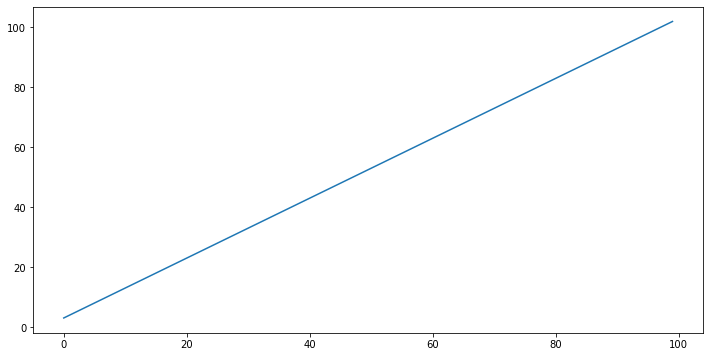

array([  3,   4,   5,   6,   7,   8,   9,  10,  11,  12,  13,  14,  15,
        16,  17,  18,  19,  20,  21,  22,  23,  24,  25,  26,  27,  28,
        29,  30,  31,  32,  33,  34,  35,  36,  37,  38,  39,  40,  41,
        42,  43,  44,  45,  46,  47,  48,  49,  50,  51,  52,  53,  54,
        55,  56,  57,  58,  59,  60,  61,  62,  63,  64,  65,  66,  67,
        68,  69,  70,  71,  72,  73,  74,  75,  76,  77,  78,  79,  80,
        81,  82,  83,  84,  85,  86,  87,  88,  89,  90,  91,  92,  93,
        94,  95,  96,  97,  98,  99, 100, 101, 102])

In [1]:
##lineAndRandomPoints
import numpy as np
import matplotlib.pyplot as plt

line = np.array([i + 3 for i in range(100)])
figure = plt.figure(figsize = (12,6))
plt.plot(line)
plt.show()
line

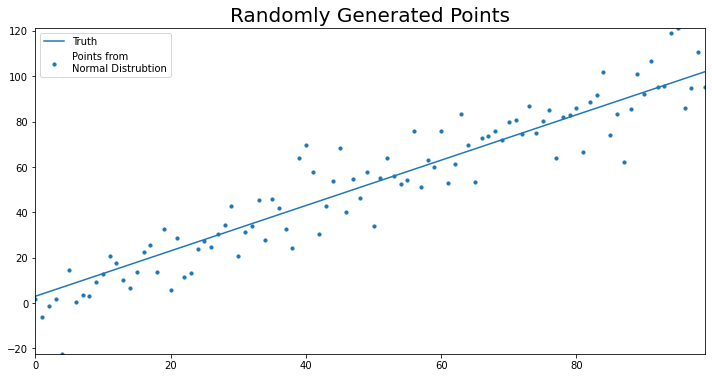

In [2]:
import random

points = []
for point in line:
    points.append(random.normalvariate(point, 10))

figure = plt.figure(figsize = (12, 6))
plt.rcParams["axes.xmargin"] = 0
plt.rcParams["axes.ymargin"] = 0
plt.plot(line, label ="Truth")
plt.scatter(np.arange(len(points)), points, s = 10,
           label = "Points from\nNormal Distrubtion")
plt.title("Randomly Generated Points", fontsize = 20)
plt.legend(loc = "best")
plt.show()

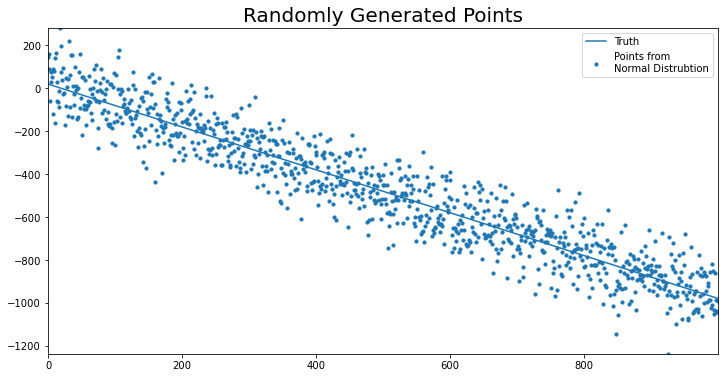

In [3]:
import random

def build_random_data_with_line(y_int, slope, SD = 1, line_length = 100):
    line = np.array([slope * i + y_int for i in range(line_length)])    
    points = []
    for point in line:
        points.append(random.normalvariate(point, SD))
        
    return line, points

def plot_line(line, points, line_name = "Truth",
              title = "Randomly Generated Points"):

    figure = plt.figure(figsize = (12, 6))
    plt.rcParams["axes.xmargin"] = 0
    plt.rcParams["axes.ymargin"] = 0
    plt.plot(line, label =line_name)
    plt.scatter(np.arange(len(points)), points, s = 10,
               label = "Points from\nNormal Distrubtion")
    plt.title("Randomly Generated Points", fontsize = 20)
    plt.legend(loc = "best")
    plt.show()
    
line, points = build_random_data_with_line(y_int = 20, slope = -1, SD = 100, line_length = 1000)
plot_line(line, points)

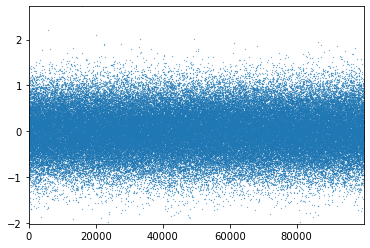

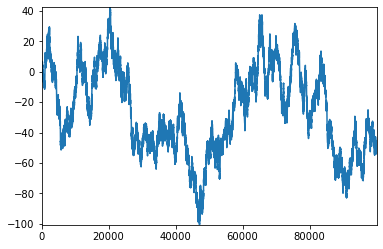

In [4]:
#montecarloSimulation

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import random


mu = 0
#SD is sigma, variance is sigma**2
sigma = .5
random_list = []
observations = 100000
for i in range(100000):
    random_list.append(random.normalvariate(mu, sigma))

plt.plot(random_list, ls = "",linewidth = 1, marker =".", markersize = .5)
plt.show()
plt.close()

simulation = [] 

for i in range(len(random_list)):
    val = random_list[i]
    if i == 0:
        simulation.append(val)
    else:
        simulation.append(simulation[i-1] + val)
        
plt.plot(simulation)
plt.show()
plt.close()



In [5]:
def run_monte_carlo(mean, sigma, num_sims, sim_dict, index):
    
    for i in range(num_sims):
        sim_dict[i] = {}
        for ix in index:
            sim_dict[i][ix] = random.normalvariate(mean, sigma)


In [6]:
mean = 0
sigma = 1
monte_carlo_sim_dict = {}
num_sims = 2000
index = np.arange(2000)
run_monte_carlo(mean, sigma, num_sims, monte_carlo_sim_dict, index)
        
monte_carlo_sim_df = (pd.DataFrame(monte_carlo_sim_dict))
        
monte_carlo_sim_df

,0,1,2,3,4,5,6,7,8,9,...,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999
0,-0.824882,1.308764,0.662750,1.221881,0.419976,0.369925,1.121408,-0.797091,-1.387408,1.561776,...,1.525937,-0.860246,0.504903,0.488550,0.572423,2.049026,0.503595,-0.497506,-0.871140,-0.612808
1,0.690428,-0.425706,0.929929,-1.154084,0.038392,0.285903,-0.648118,2.535820,0.638651,1.095825,...,-1.070114,-0.197376,-0.486008,-0.386291,0.835666,-0.825628,0.514814,0.640344,-0.383779,-0.518052
2,-0.157938,1.733211,1.016528,-0.907036,0.946552,0.081932,-0.588836,-0.452030,-1.334008,-0.805160,...,-0.727341,0.379167,0.107154,0.214949,-2.245171,1.321617,1.093882,0.235305,-0.055654,-1.324895
3,-0.356753,-0.392607,-2.400213,-2.130252,0.307729,0.490649,-2.110167,-0.704562,1.204998,0.976294,...,-1.023551,-0.168446,1.076211,1.236685,-0.491726,0.719779,-0.809803,0.842099,1.612176,-0.649214
4,0.997256,1.579206,-1.851543,0.594442,0.077651,1.827787,2.332675,0.240755,1.501674,-2.187785,...,-0.882721,-0.187578,1.113359,-1.471882,0.163091,0.392649,0.092929,-0.796987,1.241390,-0.505871
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,-0.998386,-0.602803,-1.376610,-0.430616,-0.570350,-0.610220,1.241081,0.116152,1.287641,-0.932406,...,0.432634,-1.929185,1.798652,-0.350109,0.538061,-0.286171,-0.358130,-0.675435,0.139984,0.030501
1996,0.667904,-0.349751,-0.133054,1.822255,2.396770,-1.416648,0.574683,-2.014022,-1.629756,-0.353044,...,-0.111570,1.532824,0.797767,2.301722,-0.915247,0.701098,0.292322,-0.199627,-1.039738,0.200546
1997,-0.773640,1.337838,-0.939740,0.335447,0.233609,0.986029,-0.229787,0.795589,-0.965214,0.337224,...,0.005313,-0.957018,-0.143613,0.172133,1.824102,-1.873336,0.047963,2.451881,-0.629003,-0.711706
1998,-0.012944,-1.164865,-0.562253,0.252953,-0.998992,-0.398786,1.162818,1.423664,-1.401339,0.712001,...,-2.660363,-0.246824,-1.532722,-2.272652,0.412922,2.156903,0.353895,-0.688351,0.490164,-0.185178


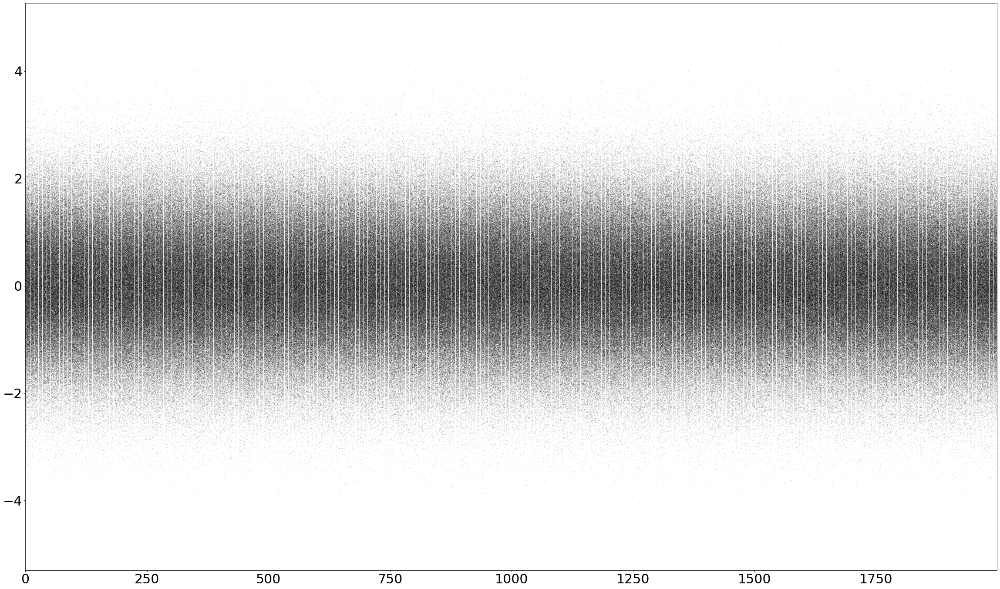

In [7]:
plt.rcParams["axes.xmargin"] = 0
plt.rcParams["axes.ymargin"] = 0
plt.rcParams["font.size"] = 30

fig, ax = plt.subplots(figsize = (40, 24))
monte_carlo_sim_df.plot.line(legend = False, ls = " ", marker=".", markersize = .2, 
                            color ="k", alpha = .5, ax = ax)

plt.show()

<ipython-input-8-d93dfd6ebd52>:7: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([str(int(y * 100)) + "%" for y in y_vals])


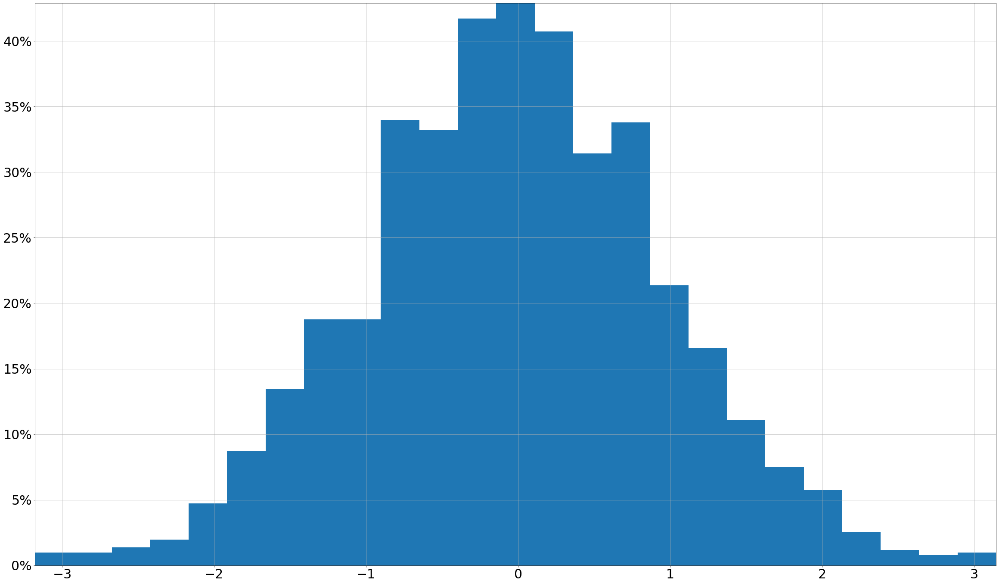

In [8]:
fig, ax = plt.subplots(figsize = (40, 24))
monte_carlo_sim_df.iloc[-1].hist(bins = 25, density = True,
                                ax = ax)

# set vertical axis values as percent
y_vals = ax.get_yticks()
ax.set_yticklabels([str(int(y * 100)) + "%" for y in y_vals])
plt.show()
plt.close()

## Monte Carlo with a Positive Trend

In [9]:
mean = .05
sigma = .5
monte_carlo_sim_dict = {}
num_sims = 2000
periods = 2000
index = np.arange(periods)
run_monte_carlo(mean, sigma, num_sims, monte_carlo_sim_dict, index)

monte_carlo_sim_df = pd.DataFrame(monte_carlo_sim_dict).cumsum()
monte_carlo_sim_df

,0,1,2,3,4,5,6,7,8,9,...,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999
0,0.078479,0.067700,0.186180,-0.333602,0.802502,0.586903,-0.060557,-0.325849,-0.425045,-0.049601,...,0.616087,-0.186870,-0.111238,0.744004,0.656102,0.699003,-0.076848,0.234309,0.093588,-1.433604
1,0.450111,0.372354,0.493946,-0.497709,0.816921,-0.011166,-0.132906,0.136330,-0.628621,-0.144038,...,0.342770,0.152237,0.514972,0.895554,1.200240,0.613163,0.023431,1.151819,-0.123787,-1.848402
2,0.660109,-0.272314,0.797493,-1.152133,0.239979,-0.283584,-0.299073,-0.140370,-1.056818,-0.145015,...,0.532390,0.865657,-0.795276,1.089377,1.203399,0.877685,0.543937,1.544026,0.028276,-1.772964
3,0.461479,0.012202,0.075407,-1.779951,1.294916,-0.101811,0.296622,-0.643916,-0.795581,0.000655,...,-0.245994,0.438721,-0.934460,1.825365,1.437587,1.060202,0.921821,1.187322,0.426376,-1.422504
4,0.757812,0.260848,0.412974,-1.834891,0.784452,-0.925672,-1.202222,-0.220469,-0.746451,-0.339962,...,-0.028250,1.290523,-0.257196,1.508492,1.125371,1.364259,0.232912,2.309183,0.793344,-1.007986
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,97.607598,96.990647,120.431376,44.585289,81.621305,139.054419,80.140330,53.505779,63.823246,119.600049,...,84.629329,155.094394,141.029398,92.493730,121.661552,78.332775,111.527080,96.025433,99.643622,87.096261
1996,97.864926,96.631534,121.151051,43.789194,81.346766,139.614149,81.382302,53.041839,63.432570,118.782282,...,84.673692,155.586070,140.609665,92.678857,121.676982,78.542883,111.471775,96.604765,99.791432,86.381909
1997,97.536984,96.543544,120.492983,44.721382,80.984845,139.890487,81.116418,53.270598,63.101888,119.108488,...,83.855807,155.197085,141.534611,92.487206,121.592161,78.939735,110.453315,97.599378,99.620184,86.770113
1998,97.583358,96.676709,120.911682,45.164094,81.411060,139.431339,81.080865,54.415148,63.338907,119.216414,...,83.831045,155.360787,141.365211,92.400578,121.152772,78.726495,111.774159,98.367265,98.884860,86.939537


In [10]:
def plot_monte_carlo_sim(sim_data,  title = None, logy = True):
    sim_data["mean"] = sim_data.mean(axis=1)
    fig, ax = plt.subplots(figsize = (40, 24))
    sim_data.drop("mean", inplace = False, axis = 1).plot.line(
            legend=False, marker =".", markersize = .1, color = "k", alpha = .05, logy = logy, ax = ax)
    sim_data["mean"].plot.line(legend = False, color = "C3", linewidth = 5, logy = logy, ax = ax)
    index = list(sim_data.index) 
    
    
    plt.title(title, fontsize = 50)
    plt.show()
    plt.close()

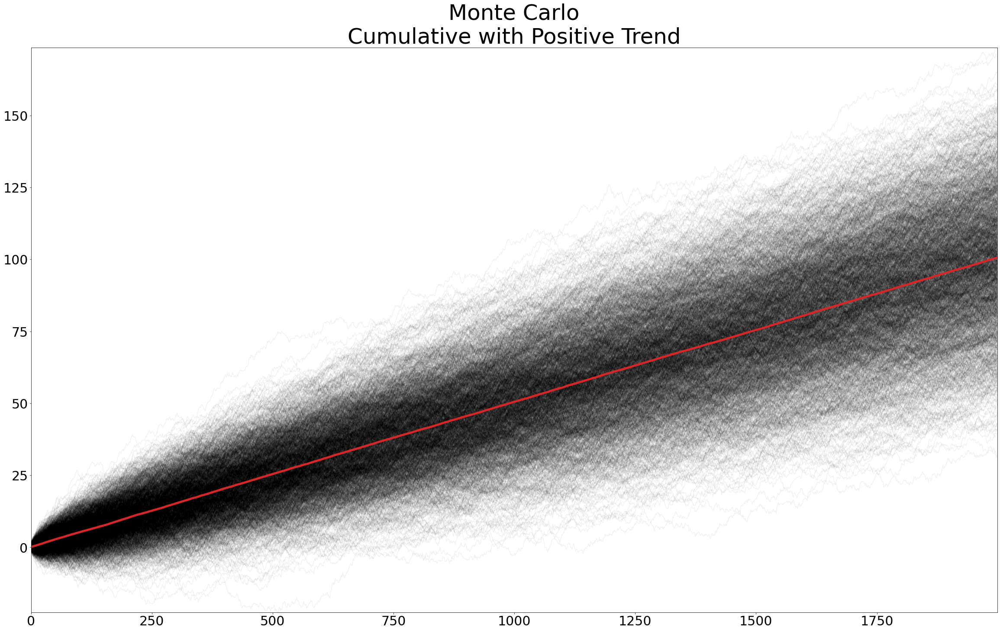

In [11]:
plot_monte_carlo_sim(monte_carlo_sim_df,  
    title = "Monte Carlo\nCumulative with Positive Trend", logy = False)


### Calculating Expected Value

In [12]:
monte_carlo_sim_df["mean"] = monte_carlo_sim_df.mean(axis = 1)
monte_carlo_sim_df["mean"]

0         0.058883
1         0.124244
2         0.186494
3         0.237985
4         0.290734
           ...    
1995    100.414536
1996    100.473735
1997    100.520864
1998    100.571574
1999    100.616016
Name: mean, Length: 2000, dtype: float64

### Simulating Changes in Portfolio Values

In [13]:
import pandas_datareader.data as web
import datetime

start = datetime.datetime(2005, 1, 1)
end = datetime.datetime.today()

data_dict = {}
stocks = "MSFT", "AAPL", "IBM", "GOOG"
for name in stocks:
    data_dict[name] = web.DataReader(name, "yahoo", start, end)

# make a list of the close data for each stock
close_data_dict = {key:val["Close"] for key, val in data_dict.items()}
close_data_df = pd.DataFrame(close_data_dict)

In [14]:
close_data_pct_change = close_data_df.pct_change()
close_data_pct_change

,MSFT,AAPL,IBM,GOOG
Date,,,,
2005-01-03,NaN,NaN,NaN,NaN
2005-01-04,0.003740,0.010270,-0.010742,-0.040501
2005-01-05,-0.002235,0.008758,-0.002068,-0.005090
2005-01-06,-0.001120,0.000775,-0.003109,-0.025632
2005-01-07,-0.002991,0.072811,-0.004366,0.028109
...,...,...,...,...
2021-08-16,0.005976,0.013548,0.002864,0.003685
2021-08-17,-0.005160,-0.006154,-0.008148,-0.011629
2021-08-18,-0.008018,-0.025501,-0.020713,-0.005320


In [15]:
close_data_normalized = close_data_pct_change.add(1).cumprod()
close_data_normalized.fillna(1, inplace =True)
close_data_normalized

,MSFT,AAPL,IBM,GOOG
Date,,,,
2005-01-03,1.000000,1.000000,1.000000,1.000000
2005-01-04,1.003740,1.010270,0.989258,0.959499
2005-01-05,1.001496,1.019118,0.987212,0.954615
2005-01-06,1.000374,1.019908,0.984143,0.930146
2005-01-07,0.997382,1.094169,0.979847,0.956292
...,...,...,...,...
2021-08-16,11.017203,133.713322,1.468951,27.514517
2021-08-17,10.960359,132.890450,1.456982,27.194541
2021-08-18,10.872476,129.501605,1.426803,27.049853


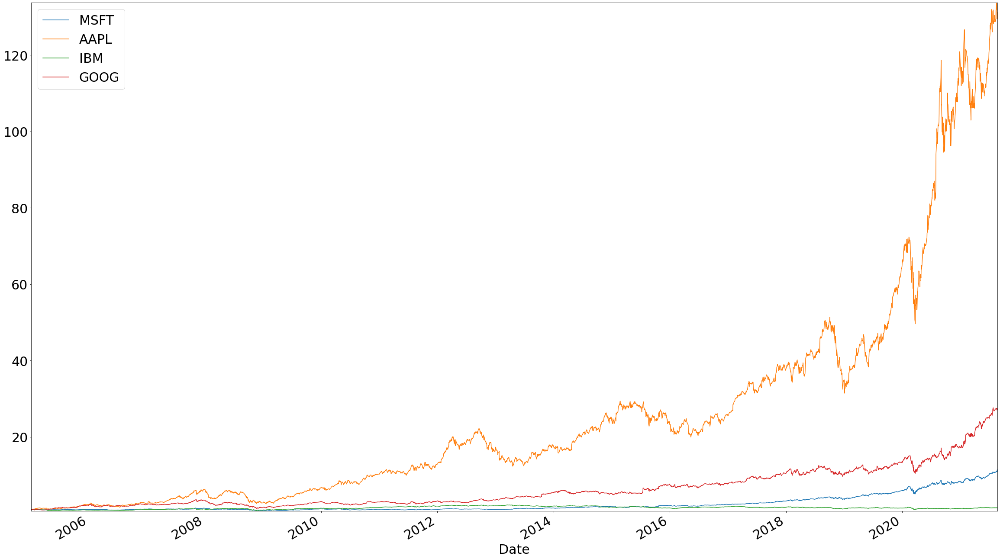

In [16]:
fig, ax = plt.subplots(figsize=(40,24))
close_data_normalized.plot.line(ax = ax)
plt.show()
plt.close()

### Daily Rate of Return

Derive the daily rate of return from the present value equation.

>$PV = \frac{FV}{(1 + r)^t}$
>
>Overall rate of return: $R=\frac{FV}{PV}$

Discount the overall rate of return to find the average rate of return. We will use this to define the mean of the standard normal distribution:

>$ r = (R)^{\frac{1}{t}} - 1$
>
>$t$ is measured in days

In [17]:
mean_var_df = pd.DataFrame({"mean": close_data_normalized.iloc[-1].div(close_data_normalized.iloc[0]) ** (
                                1 / close_data_normalized["MSFT"].count()) - 1, 
                            "sigma" : close_data_pct_change.std()})
mean_var_df

,mean,sigma
MSFT,0.000581,0.017127
AAPL,0.001165,0.020875
IBM,0.000084,0.014578
GOOG,0.000791,0.018679


In [18]:
num_sims = 500
dates = list(close_data_df.index)
monte_carlo_sim_dict = {}
for stock in stocks:
    monte_carlo_sim_dict[stock] = {}
    mean = mean_var_df["mean"][stock]
    sigma = mean_var_df["sigma"][stock]   
    run_monte_carlo(mean, sigma, num_sims, monte_carlo_sim_dict[stock], dates)
#    monte_carlo_sim_dict[stock] = pd.DataFrame(monte_carlo_sim_dict[stock]).add(1).cumprod()
monte_carlo_sim_dfs = {stock: pd.DataFrame(monte_carlo_sim_dict[stock]).add(1).cumprod() for stock in stocks}

In [19]:
monte_carlo_sim_dfs

{'MSFT':                  0         1         2         3          4          5    \
 2005-01-03  1.053563  1.003726  0.984080  1.009708   1.041833   1.003781   
 2005-01-04  1.052441  1.021892  0.964191  1.017376   1.051140   1.019242   
 2005-01-05  1.059702  1.018319  0.966042  1.050270   1.012380   1.026631   
 2005-01-06  1.054814  1.024562  0.965205  1.084795   1.073637   1.037407   
 2005-01-07  1.065333  1.029700  0.981678  1.069120   1.038813   1.052714   
 ...              ...       ...       ...       ...        ...        ...   
 2021-08-16  4.239206  7.681533  2.201181  8.085827  21.114711  40.516364   
 2021-08-17  4.359741  7.704332  2.156041  7.936421  21.419464  41.130207   
 2021-08-18  4.352891  7.869818  2.114742  7.946706  21.323160  40.631783   
 2021-08-19  4.314441  7.743833  2.108032  8.028576  20.933080  41.339213   
 2021-08-20  4.415739  7.417982  2.135793  7.924041  20.878240  40.742088   
 
                   6         7         8         9    ...       49

In [20]:
def plot_monte_carlo_sim(sim_data, observed_data = None, title = None, logy = True):
    sim_data["mean"] = sim_data.mean(axis=1)    
    index = sim_data.index
    fig, ax = plt.subplots(figsize = (40, 24))
    sim_data.drop(["mean"], inplace = False, axis = 1).plot.line(
            legend=False, marker =".", markersize = .1, color = "k", alpha = .05, logy = logy, ax = ax)
    if observed_data is not None:
        observed_data.plot.line(legend = False, color = "C2", linewidth = 5, logy = logy, ax = ax)
    
        # find x coordinate of lowest value observed
        obs_text_x = observed_data[observed_data == observed_data.min()].index
        plt.text(obs_text_x, observed_data.loc[obs_text_x] * .7,
                 "Observed", fontsize = 70, color = "C2")
    sim_data["mean"].plot.line(legend = False, color = "C3", 
                               linewidth = 5, logy = logy, ax = ax)
    plt.text(index[-400], sim_data["mean"].iloc[-400] * 1.5, "Exp\nVal",
            fontsize = 70, color = "C3")
   
    
    
    plt.title(title, fontsize = 50)
    plt.show()
    plt.close()

In [21]:
monte_carlo_sim_dfs[stock].median(axis = 1)

2005-01-03     1.000026
2005-01-04     1.000996
2005-01-05     1.002078
2005-01-06     1.002986
2005-01-07     1.004279
                ...    
2021-08-16    15.428141
2021-08-17    15.379355
2021-08-18    15.372501
2021-08-19    15.429274
2021-08-20    15.436144
Length: 4188, dtype: float64

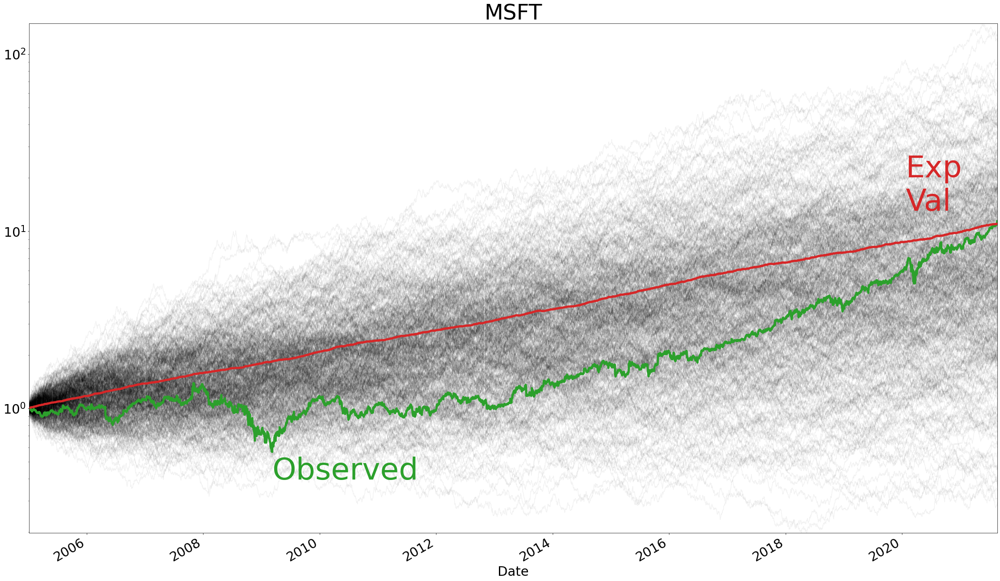

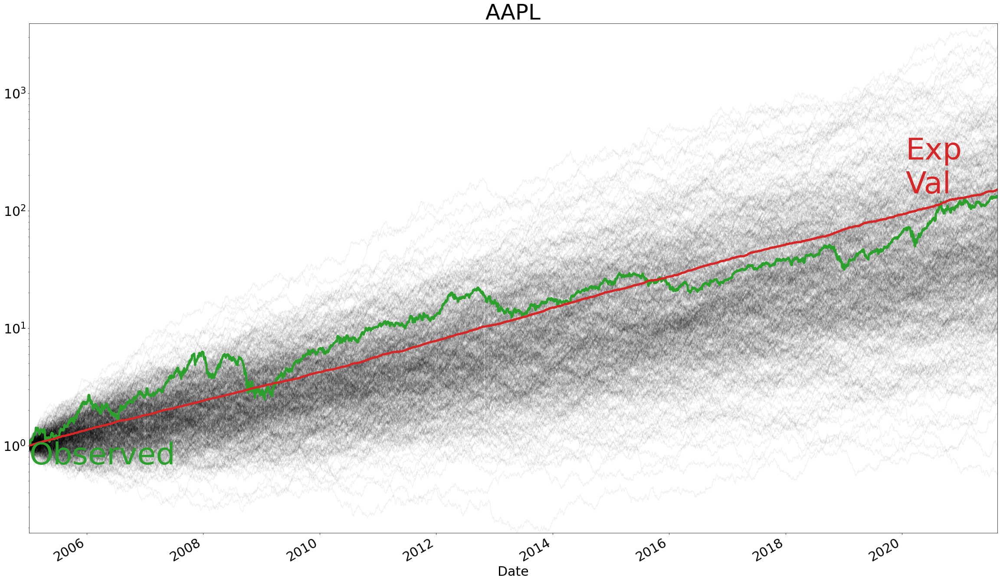

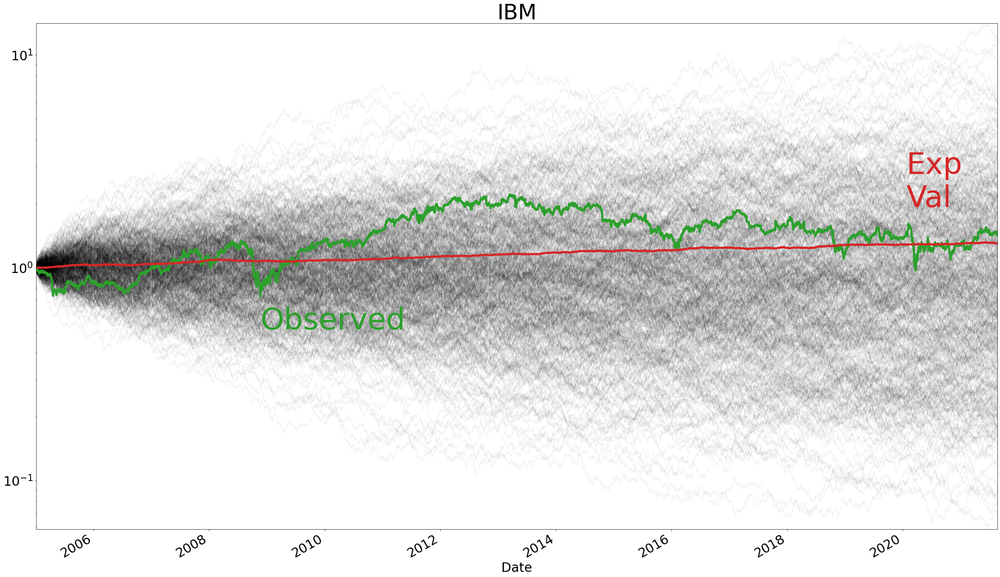

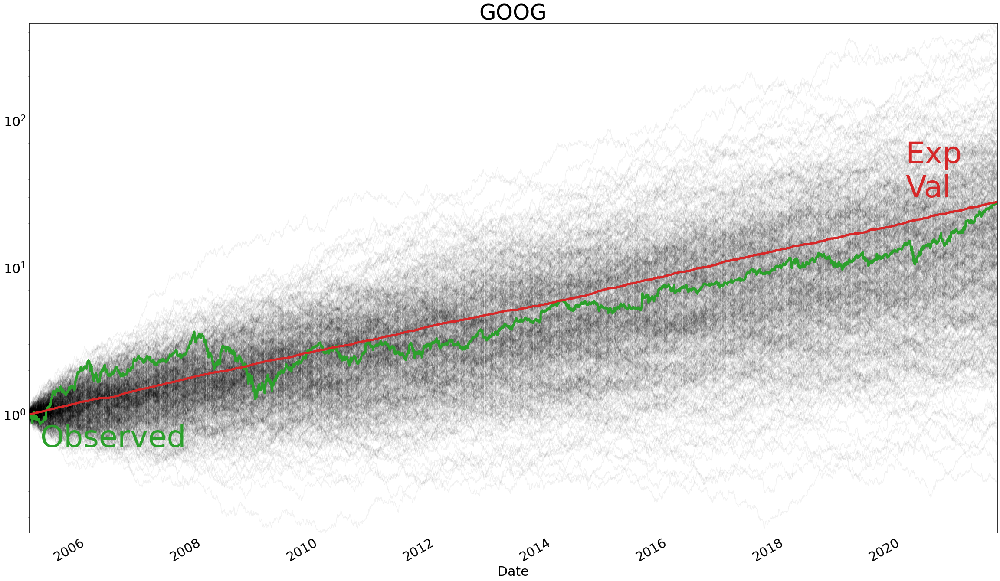

In [22]:
for stock in stocks:
    plot_monte_carlo_sim(monte_carlo_sim_dfs[stock], close_data_normalized[stock], stock, logy= True)


## Calculate Portfolio Return

In [23]:
portfolio_weights = {stock: 1 / len(stocks) for stock in stocks}
portfolio_weights

{'MSFT': 0.25, 'AAPL': 0.25, 'IBM': 0.25, 'GOOG': 0.25}

In [24]:
ex_return = pd.DataFrame(close_data_normalized.apply(lambda x :x.mul(portfolio_weights[x.name]), axis = 0).sum(axis=1),
                        columns = ["Portfolio Return"])
close_data_normalized["Portfolio Return"] = ex_return
close_data_normalized

,MSFT,AAPL,IBM,GOOG,Portfolio Return
Date,,,,,
2005-01-03,1.000000,1.000000,1.000000,1.000000,1.000000
2005-01-04,1.003740,1.010270,0.989258,0.959499,0.990692
2005-01-05,1.001496,1.019118,0.987212,0.954615,0.990610
2005-01-06,1.000374,1.019908,0.984143,0.930146,0.983643
2005-01-07,0.997382,1.094169,0.979847,0.956292,1.006923
...,...,...,...,...,...
2021-08-16,11.017203,133.713322,1.468951,27.514517,43.428498
2021-08-17,10.960359,132.890450,1.456982,27.194541,43.125583
2021-08-18,10.872476,129.501605,1.426803,27.049853,42.212684


<AxesSubplot:xlabel='Date'>

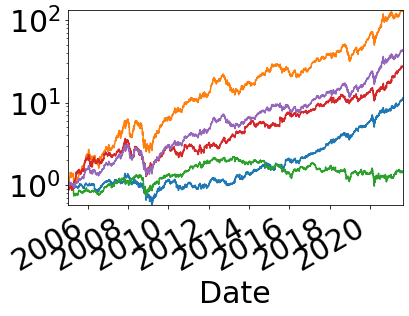

In [25]:
close_data_normalized.plot.line(legend=False, logy = True)

In [26]:
ex_return_pct_change = ex_return.pct_change()
ex_return_pct_change.dropna(inplace = True)
ex_return_pct_change

,Portfolio Return
Date,
2005-01-04,-0.009308
2005-01-05,-0.000082
2005-01-06,-0.007033
2005-01-07,0.023667
2005-01-10,0.001298
...,...
2021-08-16,0.011400
2021-08-17,-0.006975
2021-08-18,-0.021168


In [27]:
mean_var_df = pd.DataFrame({"mean": (ex_return.iloc[-1] / ex_return.iloc[0]) **(1 / ex_return["Portfolio Return"].count()) -1,
                           "sigma" : ex_return_pct_change.std()})
mean_var_df

,mean,sigma
Portfolio Return,0.000898,0.016538


In [28]:
num_sims = 1000
dates = ex_return.index
monte_carlo_sim_dict = {}
mean = mean_var_df["mean"]["Portfolio Return"]
sigma = mean_var_df["sigma"]["Portfolio Return"]
run_monte_carlo(mean, sigma, num_sims, monte_carlo_sim_dict, dates)
monte_carlo_sim_df = pd.DataFrame(monte_carlo_sim_dict).add(1).cumprod()
monte_carlo_sim_df

,0,1,2,3,4,5,6,7,8,9,...,990,991,992,993,994,995,996,997,998,999
2005-01-03,1.000498,1.001900,1.005910,1.000265,0.992145,1.021637,1.003311,0.985248,0.971697,0.972969,...,0.978144,0.986102,0.989915,1.010049,0.987906,1.010800,1.006337,1.011813,0.993565,0.976867
2005-01-04,1.007038,1.006432,0.998970,0.986136,0.985194,1.037900,1.008015,0.947983,0.989081,0.987836,...,0.995878,0.974349,0.989869,0.987726,1.008451,1.015984,1.003309,1.003949,0.982008,0.982651
2005-01-05,1.011888,0.966786,0.992157,0.971938,0.995614,1.051474,1.011967,0.954512,0.998209,0.982718,...,0.998565,0.989574,0.999988,1.021462,1.023785,0.987593,0.949241,0.989946,0.993534,0.996830
2005-01-06,1.011141,0.968888,0.988026,0.958616,0.997806,1.048722,1.019211,0.948955,0.980197,0.969708,...,1.000704,0.979867,0.990861,1.030711,1.025212,1.016057,0.956558,1.006959,1.017665,1.002649
2005-01-07,1.011129,0.978532,1.017629,0.957952,0.997970,1.052190,1.047014,0.956386,0.993098,0.936931,...,1.001738,0.993777,0.965319,1.023774,1.020650,1.039165,0.980223,1.017012,1.013001,1.002251
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-08-16,3.012508,17.309580,18.521044,29.262178,43.720489,219.758607,47.910968,43.271354,33.331294,20.251090,...,39.449873,6.718233,116.145043,30.468826,22.272532,88.366530,6.605648,23.559825,155.509840,11.000027
2021-08-17,3.000861,17.595527,18.845198,29.662866,42.532594,220.404568,48.317963,42.472307,33.295857,20.693656,...,38.667742,6.671945,117.872127,30.683777,22.560734,88.717197,6.713872,23.148150,154.182456,11.145464
2021-08-18,3.054657,17.265137,18.446986,29.107579,41.582188,218.235596,48.240630,42.930195,33.033456,21.449375,...,38.923408,6.563413,115.668388,31.588486,22.547103,86.787500,6.796293,23.287419,156.890141,11.333316
2021-08-19,3.065793,17.602233,18.689565,28.466499,40.507098,214.347665,47.931794,43.082565,32.555834,21.906278,...,39.359363,6.582548,117.830608,31.354540,21.958801,85.327144,6.617235,23.372507,154.117870,11.404500


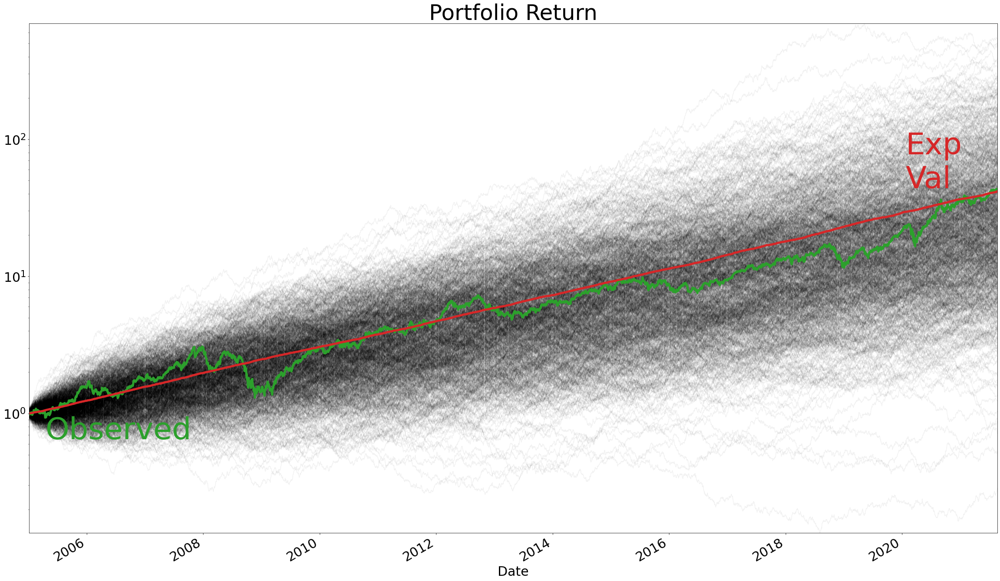

In [29]:
plot_monte_carlo_sim(monte_carlo_sim_df, ex_return["Portfolio Return"], "Portfolio Return", logy= True)